In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/943 (5).jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/534 (7).jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/81 (2).jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/869 (9).jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/610 (10).jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/623.jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/697 (8).jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/194 (4).jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/435 (3).jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/380 (3).jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/491 (8).jpg
/kaggle/input/cifake-real-and-ai-generated-synthetic-images/test/FAKE/680 (8).jpg
/kaggle/input/cifake

2024-04-23 02:29:19.427582: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-23 02:29:19.427692: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-23 02:29:19.600586: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Found 100000 files belonging to 2 classes.
0.0
255.0
3125


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
  11/3125 ━━━━━━━━━━━━━━━━━━━━ 45s 15ms/step - accuracy: 0.6436 - loss: 0.8154

I0000 00:00:1713839419.906093      85 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1713839419.928834      85 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


3119/3125 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.8411 - loss: 0.3699

W0000 00:00:1713839598.057031      84 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


3125/3125 ━━━━━━━━━━━━━━━━━━━━ 191s 58ms/step - accuracy: 0.8412 - loss: 0.3697 - val_accuracy: 0.7613 - val_loss: 0.4927 - learning_rate: 9.5000e-04
Epoch 2/10
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 48s 15ms/step - accuracy: 0.9072 - loss: 0.2284 - val_accuracy: 0.9150 - val_loss: 0.2155 - learning_rate: 9.0250e-04
Epoch 3/10
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 81s 15ms/step - accuracy: 0.9185 - loss: 0.2068 - val_accuracy: 0.9140 - val_loss: 0.2067 - learning_rate: 8.5737e-04
Epoch 4/10
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 46s 15ms/step - accuracy: 0.9281 - loss: 0.1852 - val_accuracy: 0.9353 - val_loss: 0.1647 - learning_rate: 8.1451e-04
Epoch 5/10
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 46s 15ms/step - accuracy: 0.9346 - loss: 0.1697 - val_accuracy: 0.9174 - val_loss: 0.1975 - learning_rate: 7.7378e-04
Epoch 6/10
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 47s 15ms/step - accuracy: 0.9381 - loss: 0.1615 - val_accuracy: 0.9464 - val_loss: 0.1382 - learning_rate: 7.3509e-04
Epoch 7/10
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 45s 14ms

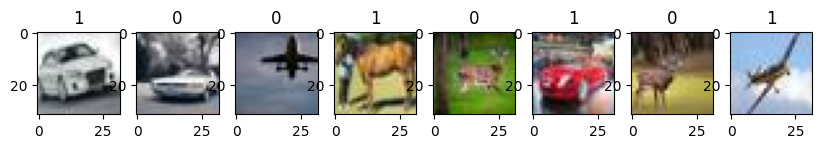

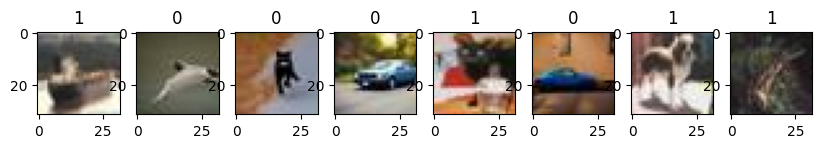

In [2]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping
from matplotlib import pyplot as plt

# GPU memory growth configuration
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# Load image dataset
data = tf.keras.utils.image_dataset_from_directory('/kaggle/input/cifake-real-and-ai-generated-synthetic-images/train', image_size=(32, 32))

# Visualize a batch of images
data_it = data.as_numpy_iterator()
batch = data_it.next()

fig, ax = plt.subplots(ncols=8, figsize=(10, 10))
for idx, img in enumerate(batch[0][:8]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])

print(batch[0].min())
print(batch[0].max())

# Scale pixel values to the range [0, 1]
data = data.map(lambda x, y : (x/255, y))

# Visualize a scaled batch of images
scaled_it = data.as_numpy_iterator()
batch = scaled_it.next()

fig, ax = plt.subplots(ncols=8, figsize=(10, 10))
for idx, img in enumerate(batch[0][:8]):
    ax[idx].imshow(img.astype(float))
    ax[idx].title.set_text(batch[1][idx])

# Split the dataset
train_size = int(len(data) * 0.7)
cv_size = int(len(data) * 0.2)
test_size = int(len(data) * 0.1) + 1

train = data.take(train_size)
cv = data.skip(train_size).take(cv_size)
test = data.skip(train_size + cv_size).take(test_size)

print(len(train) + len(cv) + len(test))


# Define the CNN model with enhancements
model = models.Sequential()

model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(32, 32, 3)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())

model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

# Learning rate scheduler
initial_learning_rate = 0.001
def lr_scheduler(epoch, lr):
    return lr * 0.95  # Adjust the decay factor as needed
lr_schedule = LearningRateScheduler(lr_scheduler)
optimizer = Adam(learning_rate=initial_learning_rate)

# Compile the model
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Data Augmentation in the pipeline
def augment_data(x, y):
    x = tf.image.random_flip_left_right(x)
    x = tf.image.random_flip_up_down(x)
    x = tf.image.random_brightness(x, max_delta=0.1)
    x = tf.image.random_contrast(x, lower=0.9, upper=1.1)
    return x, y

train_augmented = data.map(augment_data)

# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model
history = model.fit(train_augmented, validation_data=cv, epochs=10, callbacks=[lr_schedule, early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')